In [2]:
include("sensor.jl") # To retrieve Sensor Positions
include("./doa/cbf.jl") # Conventional Beamformer
include("./doa/dbf_freeform.jl") # Differential Beamformer (coordinate-free) 
include("./doa/music.jl") # MUSIC

include("./utils/preprocess.jl")

sensors Loaded: (8,)
sensors1 Loaded: (25,)
sensors2 Loaded: (20,)
sensors_underwater loaded: (40,)


In [122]:
#=
Step 0: Open recording or generate signal
=#

# To Generate Signal:
include("./signal_generator/tone.jl")

freq = 3000;          # Frequency of Tone (in Hz)
amp = 1;            # Amplitude of Tone
duration = 10;       # Duration of Tone (in seconds)
sample_rate = 32000.0;
tone_sig, n = tone(duration, amp, freq, sample_rate);

In [123]:
size(tone_sig)
typeof(tone_sig)

Matrix{Float64} (alias for Array{Float64, 2})

In [124]:
include("./signal_generator/generate_sig.jl")
using DSP.Windows: hanning, rect, bartlett
az_gt = -90;        # Ground Truth Azimuth Angle (in degrees)
az_gt2 = 120;
c0 = 1500;          # Speed of Medium (in m/s)
NFFT = 2^11;
noverlap = Int(NFFT * (3 // 4));
sig1, sample_rate = simulate_sensor_signal(tone_sig, sample_rate, sensors_underwater,
                         NFFT, noverlap, hanning, az_gt, c0);
sig2, sample_rate = simulate_sensor_signal(tone_sig, sample_rate, sensors_underwater, 
                        NFFT, noverlap, hanning, az_gt2, c0); 
new_sig = sig1 + sig2;


Start Simulating Signal
Signal has size: (320000, 1)


  1.673034 seconds (404.55 k allocations: 1.463 GiB, 19.99% gc time, 4.44% compilation time)
Now Generated Signal has size: (320000, 40)
Start Simulating Signal
Signal has size: (320000, 1)


  1.329922 seconds (180.56 k allocations: 1.453 GiB, 10.32% gc time)
Now Generated Signal has size: (320000, 40)


In [125]:
size(sig1)

(320000, 40)

In [126]:
delays

8-element Vector{Float64}:
 0.0
 0.0
 8.282798833819243e-5
 0.0001999708454810496
 0.000282798833819242
 0.000282798833819242
 0.0001999708454810496
 8.282798833819243e-5

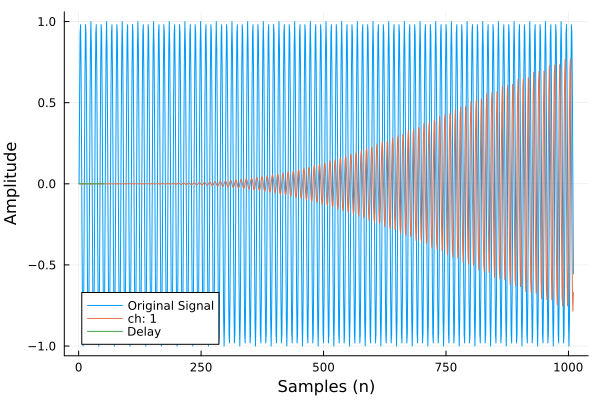

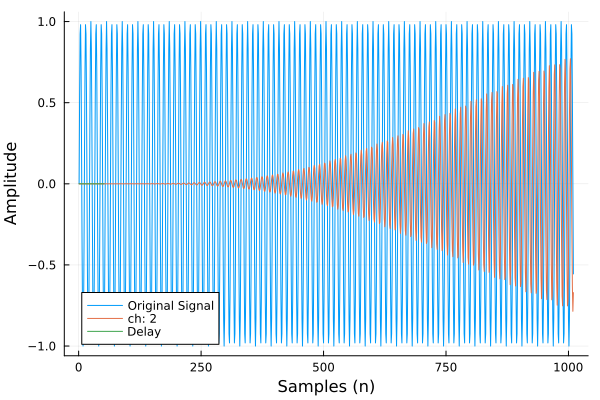

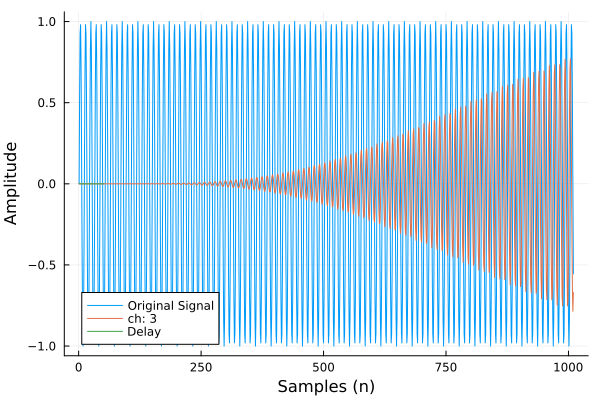

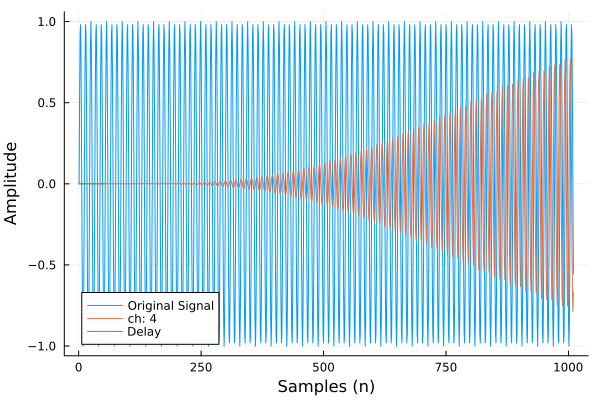

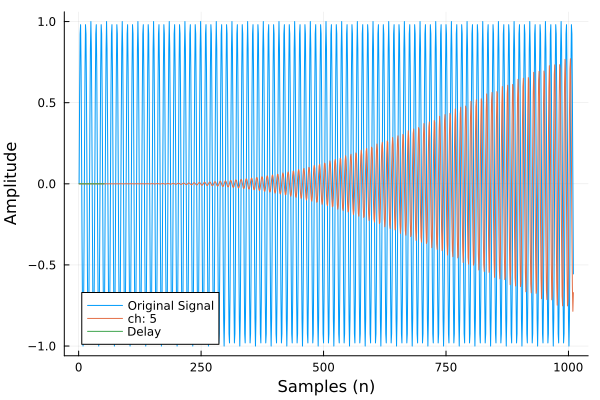

...

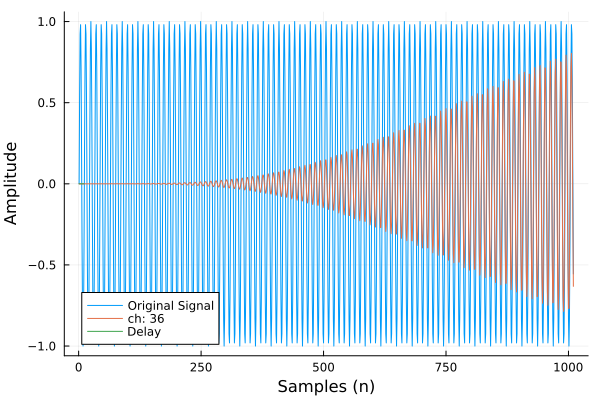

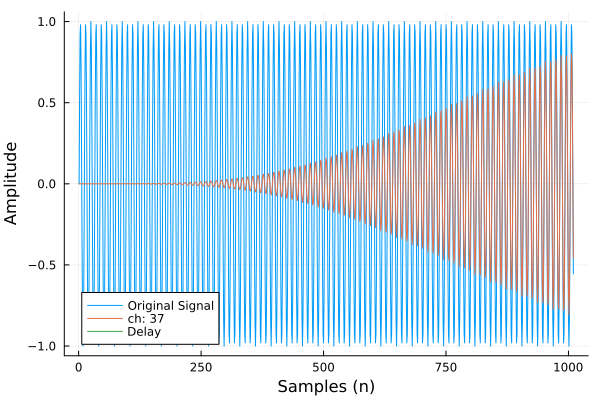

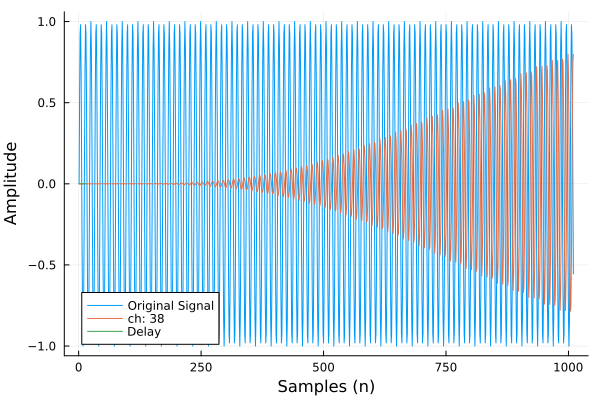

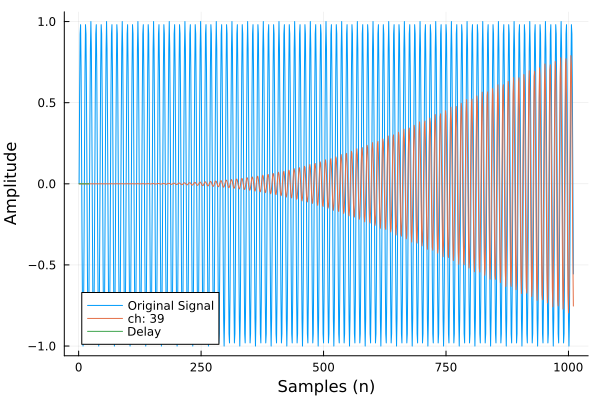

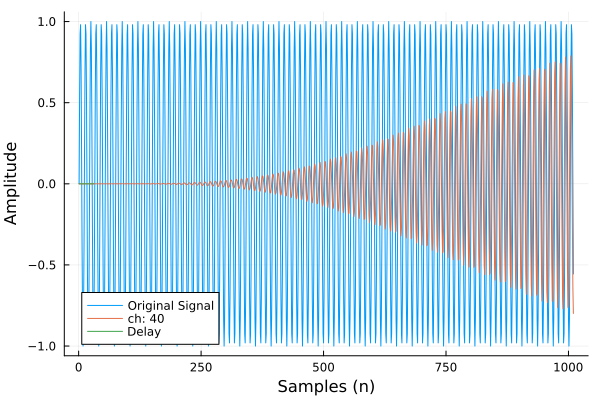

In [127]:
include("./utils/delay.jl")
using Plots
# Indicates Delay time at each sensor
delays = generate_time_delay.(sensors_underwater, az_gt, 90, c0);
delays .-= minimum(delays)
check_delayed_signal(tone_sig, sig1, delays, 10)

In [128]:
include("./doa/cbf.jl")
include("./doa/dbf_freeform.jl")

function filter_freq_per_ch(new_sig)
    new_S = []
    for sig in eachcol(new_sig)
        S_interest = choose_freq(sig, freq, sample_rate);
        push!(new_S, S_interest);
    end
    # test_sig = Matrix{}(undef, size(new_sig, 2)) 
    new_S = mapreduce(permutedims, vcat, new_S);
    return new_S
end

new_S = filter_freq_per_ch(new_sig);
new_S1 = filter_freq_per_ch(sig1);
new_S2 = filter_freq_per_ch(sig2);

In [129]:
using Statistics
n_snapshots = 2;
Rx = cov(new_S[:,1:n_snapshots], dims=2);
order = 3;
@time P_cbf, az_list = cbf(Rx, sensors_underwater, freq, c0)
@time P_dbf, az_list = dbf_coFree(Rx, sensors_underwater, order, freq, c0)

  0.094522 seconds (312.75 k allocations: 16.706 MiB, 89.63% compilation time)


weighting vector: Rational[1//7, 1//7, 1//7, 1//7, 1//7, 1//7, 1//7] has sum 1//1
ψ has rank 7
  0.133023 seconds (209.81 k allocations: 11.193 MiB, 98.73% compilation time)


([33357.886521454464, 36884.14437986161, 40399.05365420411, 43855.40486677271, 47207.680703009675, 50412.52338192151, 53429.17759333391, 56219.90454907993, 58750.362996247415, 60989.95338399244  …  9094.562765099352, 10567.421015461416, 12447.08032773429, 14693.71750453036, 17264.717186490234, 20115.133221582833, 23198.17107854823, 26465.68639924734, 29868.694624698706, 33357.8865214544], LinRange{Float64}(-180.0, 180.0, 361), ComplexF64[0.0 + 0.02911219603925727im 0.0 + 0.09656603283799528im … 0.029068794064127934 + 0.1358157969485697im 0.13390912182872836 + 0.043522109757114666im; 0.287880367515969 + 0.0im 0.18210173564238488 + 0.0im … 0.0317996216212471 - 0.07892037744978252im 0.03855944083596137 + 0.11869630445062103im; … ; 0.287880367515969 + 0.0im 0.18210173564238488 + 0.0im … 0.0317996216212471 + 0.07892037744978252im 0.03855944083596137 - 0.11869630445062103im; 0.0 + 0.02911219603925727im 0.0 + 0.09656603283799528im … -0.029068794064127934 + 0.1358157969485697im -0.133909121828

In [130]:
n_snapshots = 10;
Rx1 = cov(new_S1[:,1:n_snapshots], dims=2);
order = 3;
@time P1_cbf, az_list = cbf(Rx1, sensors_underwater, freq, c0)
@time P1_dbf, az_list = dbf_coFree(Rx1, sensors_underwater, order, freq, c0)

  0.002944 seconds (15.90 k allocations: 1.631 MiB)
weighting vector: Rational[1//7, 1//7, 1//7, 1//7, 1//7, 1//7, 1//7] has sum 1//1
ψ has rank 7
  0.001899 seconds (13.64 k allocations: 1.110 MiB)


([7040.9022277181175, 6984.030999926573, 6916.569953045525, 6838.040340486699, 6748.012588656983, 6646.11500181805, 6532.042401107669, 6405.56460786165, 6266.534679513711, 6114.896805350016  …  7168.6697544289755, 7181.59547197515, 7189.089110741654, 7190.592140671931, 7185.52684264175, 7173.302230942212, 7153.320518465931, 7124.9840813086075, 7087.702872483866, 7040.902227718116], LinRange{Float64}(-180.0, 180.0, 361), ComplexF64[0.0 + 0.02911219603925727im 0.0 + 0.09656603283799528im … 0.029068794064127934 + 0.1358157969485697im 0.13390912182872836 + 0.043522109757114666im; 0.287880367515969 + 0.0im 0.18210173564238488 + 0.0im … 0.0317996216212471 - 0.07892037744978252im 0.03855944083596137 + 0.11869630445062103im; … ; 0.287880367515969 + 0.0im 0.18210173564238488 + 0.0im … 0.0317996216212471 + 0.07892037744978252im 0.03855944083596137 - 0.11869630445062103im; 0.0 + 0.02911219603925727im 0.0 + 0.09656603283799528im … -0.029068794064127934 + 0.1358157969485697im -0.13390912182872836 +

In [131]:
n_snapshots = 2;
Rx2 = cov(new_S2[:,1:n_snapshots], dims=2);
order = 3;
@time P2_cbf, az_list = cbf(Rx2, sensors_underwater, freq, c0)
@time P2_dbf, az_list = dbf_coFree(Rx2, sensors_underwater, order, freq, c0)

  0.002521 seconds (15.90 k allocations: 1.631 MiB)
weighting vector: Rational[1//7, 1//7, 1//7, 1//7, 1//7, 1//7, 1//7] has sum 1//1
ψ has rank 7
  0.002983 seconds (13.64 k allocations: 1.110 MiB)


([9047.863888379114, 9411.794671594154, 9810.648558454703, 10233.531822123645, 10670.06943968767, 11110.498582807551, 11545.752237158753, 11967.532226093084, 12368.37104398356, 12741.682039949774  …  9254.430423068825, 8784.320919007523, 8451.478595161163, 8245.675997436798, 8156.0917393613545, 8171.443142379983, 8280.11984166299, 8470.316915823318, 8730.166125605192, 9047.863888379106], LinRange{Float64}(-180.0, 180.0, 361), ComplexF64[0.0 + 0.02911219603925727im 0.0 + 0.09656603283799528im … 0.029068794064127934 + 0.1358157969485697im 0.13390912182872836 + 0.043522109757114666im; 0.287880367515969 + 0.0im 0.18210173564238488 + 0.0im … 0.0317996216212471 - 0.07892037744978252im 0.03855944083596137 + 0.11869630445062103im; … ; 0.287880367515969 + 0.0im 0.18210173564238488 + 0.0im … 0.0317996216212471 + 0.07892037744978252im 0.03855944083596137 - 0.11869630445062103im; 0.0 + 0.02911219603925727im 0.0 + 0.09656603283799528im … -0.029068794064127934 + 0.1358157969485697im -0.1339091218287

In [132]:
function normalize_P(P, az_list) 
    (P_max, max_idx) = findmax(P);
    return (P ./ P_max), az_list[max_idx]
end

P_cbf_norm, az_cbf_max = normalize_P(P_cbf, az_list)
P_dbf_norm, az_dbf_max = normalize_P(P_dbf, az_list)
P1_cbf_norm, az1_cbf_max = normalize_P(P1_cbf, az_list)
P1_dbf_norm, az1_dbf_max = normalize_P(P1_dbf, az_list)
P2_cbf_norm, az2_cbf_max = normalize_P(P2_cbf, az_list)
P2_dbf_norm, az2_dbf_max = normalize_P(P2_dbf, az_list)

([0.0813436632096489, 0.08461553637514713, 0.08820138123785716, 0.09200325913978545, 0.09592789476423139, 0.09988751665152262, 0.10380060896890227, 0.10759256802042046, 0.11119625815171373, 0.11455246292037038  …  0.08320077322318098, 0.07897431384649509, 0.07598193749922827, 0.07413169556328768, 0.07332629974747146, 0.07346431457310858, 0.07444135853997984, 0.07615130101201784, 0.0784874421019538, 0.08134366320964884], 128.0)

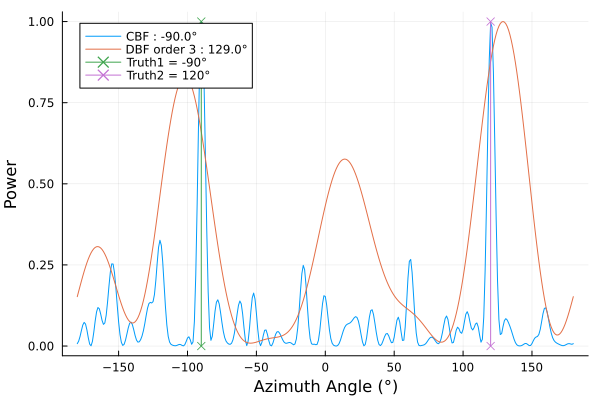

In [133]:
plot(az_list, P_cbf_norm, label="CBF : $(az_cbf_max)°")
xlabel!("Azimuth Angle (°)");
ylabel!("Power");
plot!(az_list, P_dbf_norm, label="DBF order $order : $(az_dbf_max)°")
plot!([az_gt; az_gt], [0; 1], marker=:x, label="Truth1 = $(az_gt)°")
plot!([az_gt2; az_gt2], [0; 1], marker=:x, label="Truth2 = $(az_gt2)°")


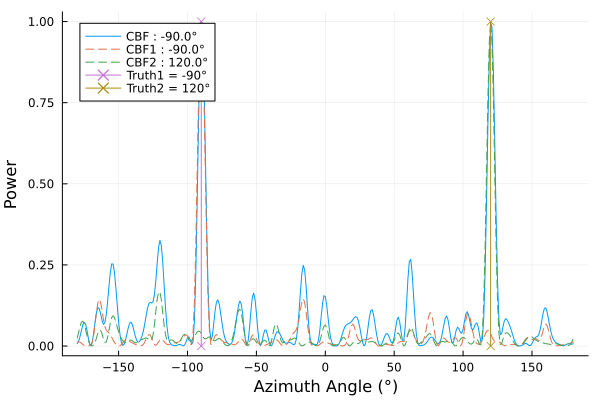

In [134]:
plot(az_list, P_cbf_norm, label="CBF : $(az_cbf_max)°")
xlabel!("Azimuth Angle (°)");
ylabel!("Power");
plot!(az_list, P1_cbf_norm, label="CBF1 : $(az1_cbf_max)°",
    linestyle=:dash);
plot!(az_list, P2_cbf_norm, label="CBF2 : $(az2_cbf_max)°",
    linestyle=:dash);
plot!([az_gt; az_gt], [0; 1], marker=:x, label="Truth1 = $(az_gt)°")
plot!([az_gt2; az_gt2], [0; 1], marker=:x, label="Truth2 = $(az_gt2)°")

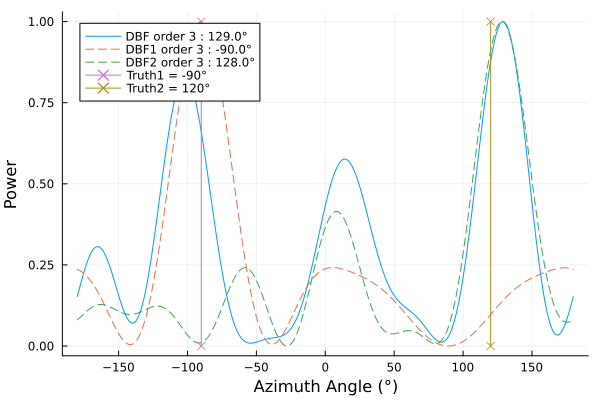

In [135]:
plot(az_list, P_dbf_norm, label="DBF order $order : $(az_dbf_max)°")
xlabel!("Azimuth Angle (°)");
ylabel!("Power");
plot!(az_list, P1_dbf_norm, label="DBF1 order $order : $(az1_dbf_max)°",
    linestyle=:dash);
plot!(az_list, P2_dbf_norm, label="DBF2 order $order : $(az2_dbf_max)°",
    linestyle=:dash);
plot!([az_gt; az_gt], [0; 1], marker=:x, label="Truth1 = $(az_gt)°")
plot!([az_gt2; az_gt2], [0; 1], marker=:x, label="Truth2 = $(az_gt2)°")


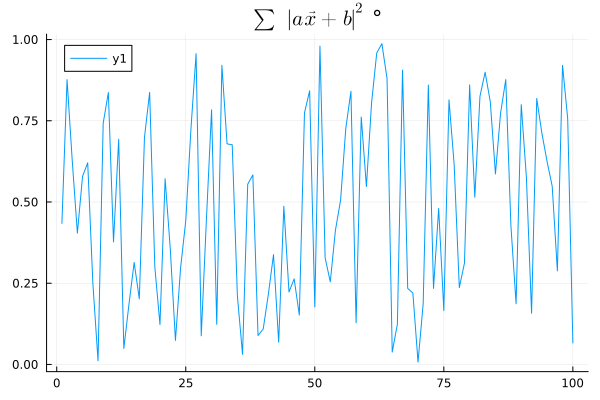

In [73]:
using Plots, LaTeXStrings
plot(rand(100))
title!(L"$\sum |a\vec{x} + b|^{2}$ °")